# FISHscale single dataset tutorial

# Imports

In [1]:
#Import FISHscale
from FISHscale.utils import dataset

#Import other libraries
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.collections import LineCollection
import numpy as np
import pickle
import os
import pandas as pd

%load_ext autoreload
%autoreload 2

Could not import Cellpose. Ignore if cell segmentation is not needed. Error: No module named 'cellpose'


# Get example data
All data can be downloaded from [FigShare](https://figshare.com/projects/Scalable_in_situ_single-cell_profiling_by_electrophoretic_capture_of_mRNA_using_EEL_FISH/143616).  

For this tutorial we only need one dataset, for example the [Mouse 440 gene experiment](https://figshare.com/articles/dataset/EEL_mouse_sagittal_440_gene_RNA_spatial_data/20324820).

In the below cell put the full path do the folder:

In [2]:
data_path = '/home/lars/Desktop/EEL_data/'

RNA_file_name = '20220821_LBEXP20210718_EEL_Mouse_448_2_RNA.parquet'

color_dictionary_file_name = 'Mouse_448_color_dict_final.pkl'

# Load data
Data can be loaded from .csv or .parquet files, where .parquet files are the most efficient. These files should at least have a column for the X and Y coordinates of the points and a colum with gene names. The names of these columns can be passed to the loading function with the parameters: `x_label`, `y_label` & `gene_label`. Other colums can be loaded using the `other_columns` parameter.  

  
The unit is also handled explicitly by giving the unit scale using the `pixel_size` parameter. For our data the XY coordinates are in pixel units which are 0.18 micrometer. Change it according to the settings of your system. If your data is already in a specific unit you can just pass this, like `1 micrometer` or `1 meter`.

The color of the genes can be predefined by giving a dictionary with colors as input. If not defined, FISHscale will generate a new color dictionary and save it fot later use.
  
The first time you load a dataset the data will be parsed which can take some time. However, the next time you load it, it will be fast.

In [3]:
file_name = data_path + RNA_file_name
color_dictionary = pickle.load(open(data_path + color_dictionary_file_name, 'rb'))


d = dataset.Dataset(file_name,
                     x_label = 'c_transformed',
                     y_label = 'r_transformed',                
                     gene_label = 'decoded_genes',
                     pixel_size = '0.27 micrometer',
                     color_input = color_dictionary,
                     exclude_genes = ['Control1', 'Control2', 'Control3', 'Control4', 'Control5', 'Control6', 'Control7', 'Control8', 'Cre'],
                     select_valid = True,
                     verbose = True,
                     reparse = False)

    Loaded: 20220821_LBEXP20210718_EEL_Mouse_448_2_RNA


You can inspect your data by quickly plotting a few genes.

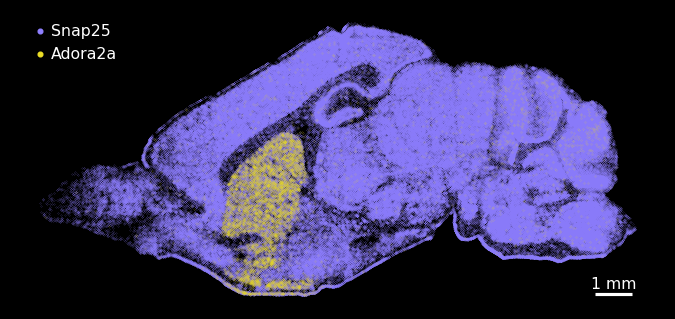

In [4]:
d.scatter_plot(['Snap25', 'Adora2a'], s=0.01)

# Data manipulation
If your dataset is not in a practical orientation you can flip or transpose:

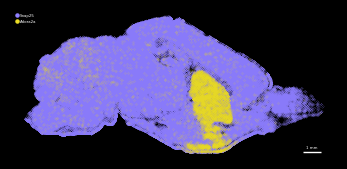

In [5]:
d.flip_x()
d.scatter_plot(['Snap25', 'Adora2a'], s=0.01, ax_scale_factor=5)

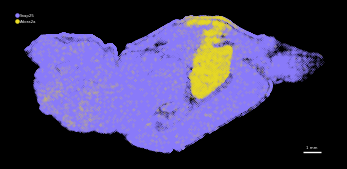

In [6]:
d.flip_y()
d.scatter_plot(['Snap25', 'Adora2a'], s=0.01, ax_scale_factor=5)

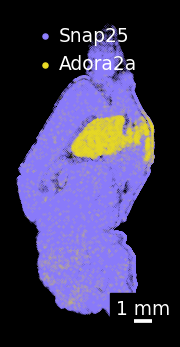

In [7]:
d.transpose()
d.scatter_plot(['Snap25', 'Adora2a'], s=0.01, ax_scale_factor=5)

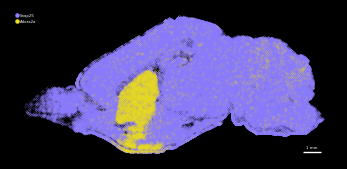

In [8]:
#Reset to best orientation
d.transpose()
d.flip_y()
d.flip_x()
d.scatter_plot(['Snap25', 'Adora2a'], s=0.01, ax_scale_factor=5)

# FISHscale attributes
The FISHscale object stores some usefull attributes that can be used for analysis. See examples below

In [9]:
print('Full path to the file ', d.filename)
print('Folder where the file is located ', d.dataset_folder)
print('Name of the dataset ', d.dataset_name)
print('Folder where the parsed data and FISHscale metadata can be found ', d.FISHscale_data_folder, '\n\n') 

Full path to the file  /home/lars/Desktop/EEL_data/20220821_LBEXP20210718_EEL_Mouse_448_2_RNA.parquet
Folder where the file is located  /home/lars/Desktop/EEL_data
Name of the dataset  20220821_LBEXP20210718_EEL_Mouse_448_2_RNA
Folder where the parsed data and FISHscale metadata can be found  /home/lars/Desktop/EEL_data/20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_FISHscale_Data 




In [10]:
#Dataset spatial metadata
print('x min ', d.x_min)
print('x max ', d.x_max)
print('x extent ', d.x_extent)
print('y min ', d.y_min)
print('y max ', d.y_max)
print('y extent ', d.y_extent)
print('z coordinate ', d.z)
print('x offset ', d.x_offset)
print('y offset ', d.y_offset)
print('z offset ', d.z_offset)
print('xy center ', d.xy_center)
print('area of one pixel ', d.pixel_area)
print('size of one pixel ', d.pixel_size)
print('unit scale ', d.unit_scale, '\n\n')

x min  -501.64138554397766
x max  16138.99055989163
x extent  16640.63194543561
y min  56.04126385399249
y max  7710.855840467151
y extent  7654.814576613158
z coordinate  0
x offset  0
y offset  0
z offset  0
xy center  (7818.674587173826, 3883.448552160572)
area of one pixel  0.0729 micrometer ** 2
size of one pixel  0.27 micrometer
unit scale  1 micrometer 




In [11]:
#All genes (showing only the first 10)
d.unique_genes[:10]

array(['2010300C02Rik', 'A830009L08Rik', 'Abi3bp', 'Ache', 'Acta2',
       'Adamts5', 'Adarb2', 'Adcyap1', 'Adora2a', 'Agrp'], dtype='<U13')

In [12]:
#Color dictionary with RGB colors for all genes (showing only one gene)
d.color_dict['Aqp4']

(1.0, 0.8136363636363644, 0.5)

In [13]:
#Total number of molecules and columns
d.shape

(8445441, 4)

In [14]:
#Dictionary with numer of molecules per gene (showing only one gene)
d.gene_n_points['Aqp4']

20486

# FISHscale data storage
All data is stored on disk to keep it memory efficient. To acces the data of a gene use the `get_gene()` function

In [15]:
d.get_gene('Aqp4')

,x,y
24573,7286.777327,7407.627424
26816,7313.433785,7363.373159
28625,7341.299034,7471.576820
28657,7297.065085,7404.693683
28693,7338.545545,7468.085442
...,...,...
86347,5809.568993,417.017413
130270,5930.244299,426.446215
130429,6087.674107,400.626344
130585,5779.806706,428.023393


# Data visualization
## Interactive visualization
Interactively visualize your data in 3D is a powerfull way to inspect large datasets. Use the second window to select one or multiple genes.
Quick tips:
- Find your genes under the button "g".
- Use + and - keys to increase or decrease dot size.  
- Ctrl/Comand and mouse to move the dataset.
- Key "r" to reset the view.
- Key "h" for all options.  
  
To close the Visualizer, click the cross on the top right corner of the gene selector pannel.

In [16]:
d.visualize()

Single Dataset
/home/lars/Desktop/EEL_data/20220821_LBEXP20210718_EEL_Mouse_448_2_RNA.parquet


Here is an example of what it looks like:
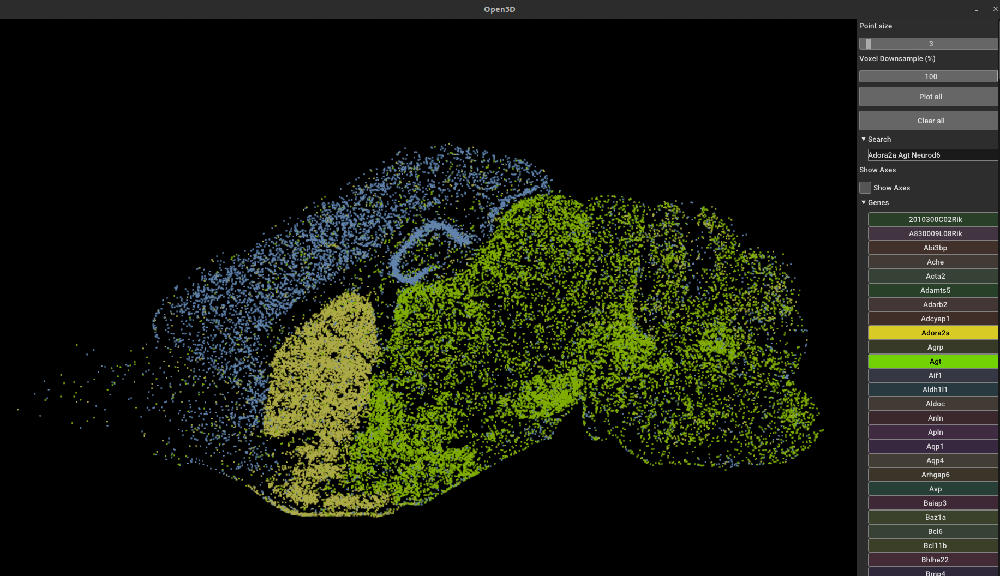

## Plotting and saving figures
Saving plots with large number of dots as vectors creates large figures and takes time. The FISHscale plotting function rasterizes the dots to save space.

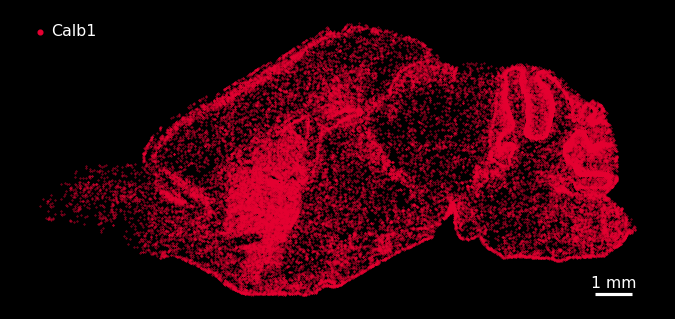

In [17]:
#Plot a single gene
d.scatter_plot('Calb1')

The scale of the plot is defined by the actual size of the data and is controlled by the `ax_scale_factor` parameter.  
The default value is 10, which means that if you save the figure, the data should be 10 times as large as the original dataset. 

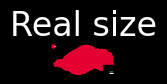

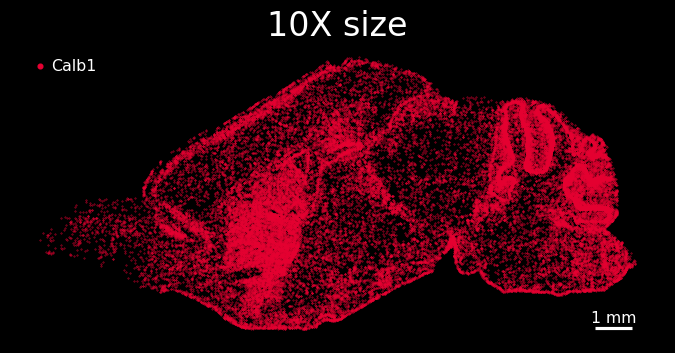

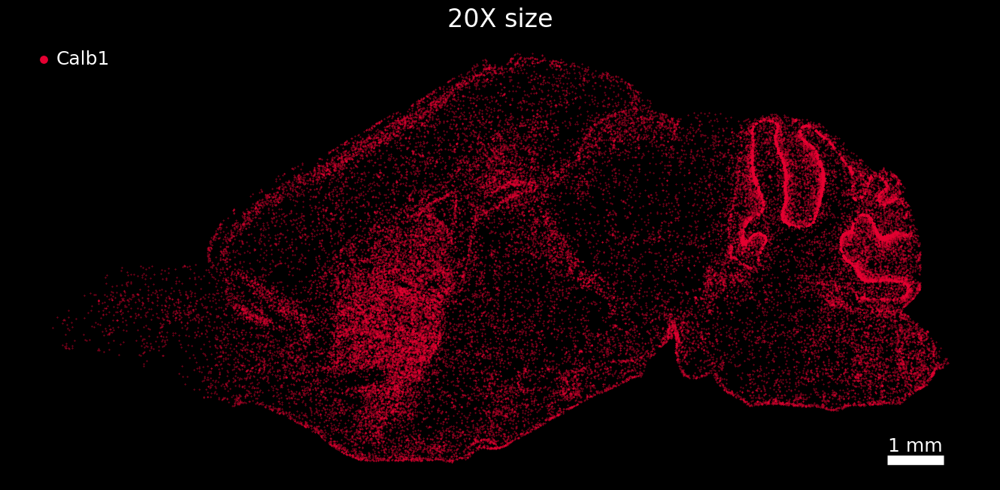

In [18]:
d.scatter_plot('Calb1', ax_scale_factor=1, title='Real size')
d.scatter_plot('Calb1', ax_scale_factor=10, title='10X size')
d.scatter_plot('Calb1', ax_scale_factor=20, title='20X size')

Can not add the legend for more than 15 genes. Please see self.color_dict for gene colors.


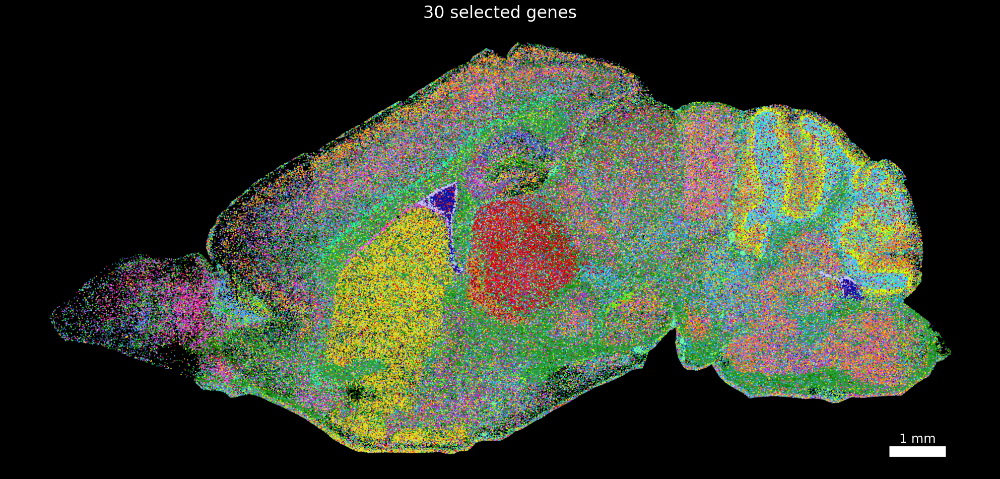

In [19]:
#Plot a list of genes in the given order (Remake of figure 1)
selected_genes = ['Cplx1', 'Mbp', 'Plp1', 'Nefh', 'Stac2', 'Cpne4','Cbln1', 
                  'Calb2', 'Pvalb', 'Gabra6', 'Vim', 'Neurod6', 'Lamp5', 'Rprm',
                  'Cplx3', 'Rasgrf2', 'Sox6', 'Dlx1', 'Th', 'Drd2', 'Adora2a',
                  'Gdf10', 'Dcn', 'Foxj1', 'Kl', 'Lef1', 'Ramp3', 'Synpo2', 
                  'Ccdc153', 'Tagln']
d.scatter_plot(selected_genes, s=0.4, ax_scale_factor=30, title='30 selected genes')

Saving the plot can be done like so:

In [ ]:
d.scatter_plot(selected_genes, 
               s=0.4, 
               ax_scale_factor=30, 
               title='30 selected genes',
               
               save = True,
               save_name = 'Test_plot',
               dpi = 300,
               file_format = '.pdf')        

The legend can be added for up to 15 genes, beyond that you can use the color dictionary to make the legend.

In [20]:
for gene in selected_genes:
    print(f'Gene: {gene :10} RGB color: {d.color_dict[gene]}')

Gene: Cplx1      RGB color: (0.09803921568627451, 0.4549019607843137, 0.6509803921568628)
Gene: Mbp        RGB color: (0.0784313725490196, 0.5411764705882353, 0.00392156862745098)
Gene: Plp1       RGB color: (0.1803921568627451, 0.6196078431372549, 0.24705882352941178)
Gene: Nefh       RGB color: (0.6627450980392157, 0.19607843137254902, 0.8196078431372549)
Gene: Stac2      RGB color: (1.0, 0.38823529411764707, 0.9686274509803922)
Gene: Cpne4      RGB color: (0.8, 0.0, 0.4117647058823529)
Gene: Cbln1      RGB color: (0.09803921568627451, 0.596078431372549, 1.0)
Gene: Calb2      RGB color: (0.25098039215686274, 0.6627450980392157, 1.0)
Gene: Pvalb      RGB color: (1.0, 0.5058823529411764, 0.09803921568627451)
Gene: Gabra6     RGB color: (0.25098039215686274, 0.8509803921568627, 1.0)
Gene: Vim        RGB color: (0.6823529411764706, 1.0, 0.0)
Gene: Neurod6    RGB color: (0.27058823529411763, 0.4823529411764706, 0.8509803921568627)
Gene: Lamp5      RGB color: (1.0, 0.5098039215686274, 0.07

It is also possible to zoom in by using the `view` input

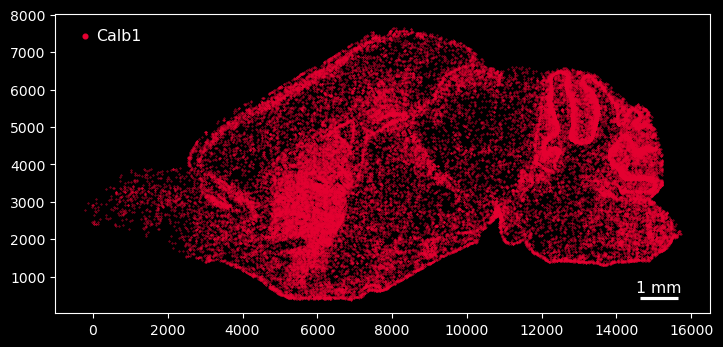

In [21]:
#First it is usefull to see the axes
d.scatter_plot('Calb1', show_axes=True)

Can not add the legend for more than 15 genes. Please see self.color_dict for gene colors.


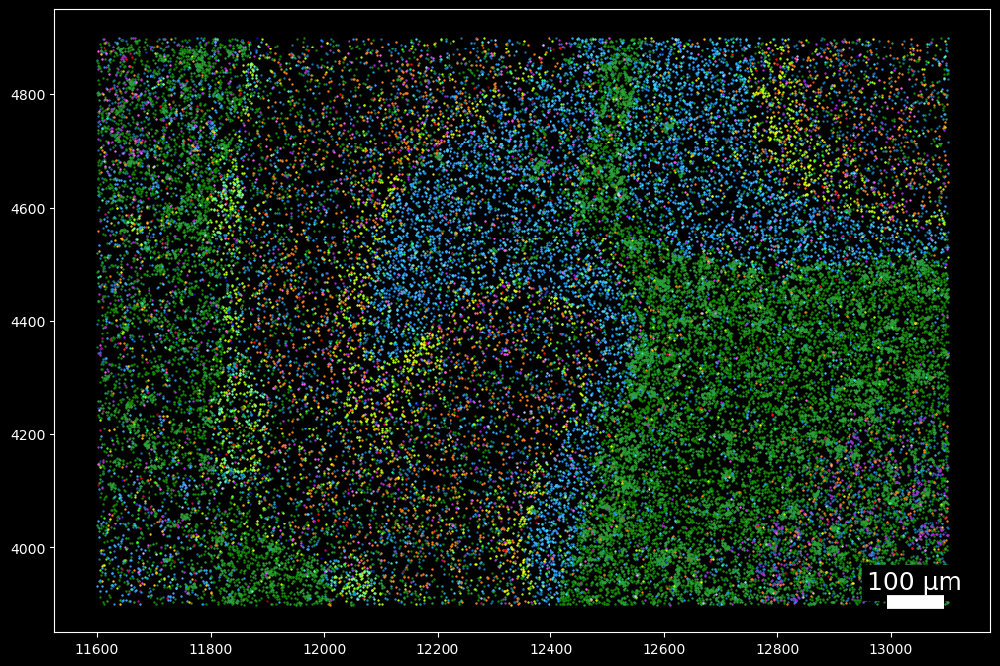

In [22]:
bottom_left = [11600, 3900]
top_right = [13100, 4900]
view = [bottom_left, top_right]

d.scatter_plot(selected_genes, view = view, ax_scale_factor=160, s=0.5, show_axes=True)

You can also plot all genes althogh this might take slightly more time.  
It is also possible to change the color of individual genes

In [23]:
custom_colors = [d.color_dict[gene] for gene in d.unique_genes]
#Set Calb1 to white
custom_colors[np.where(d.unique_genes == 'Calb1')[0][0]] = (1, 1, 1)

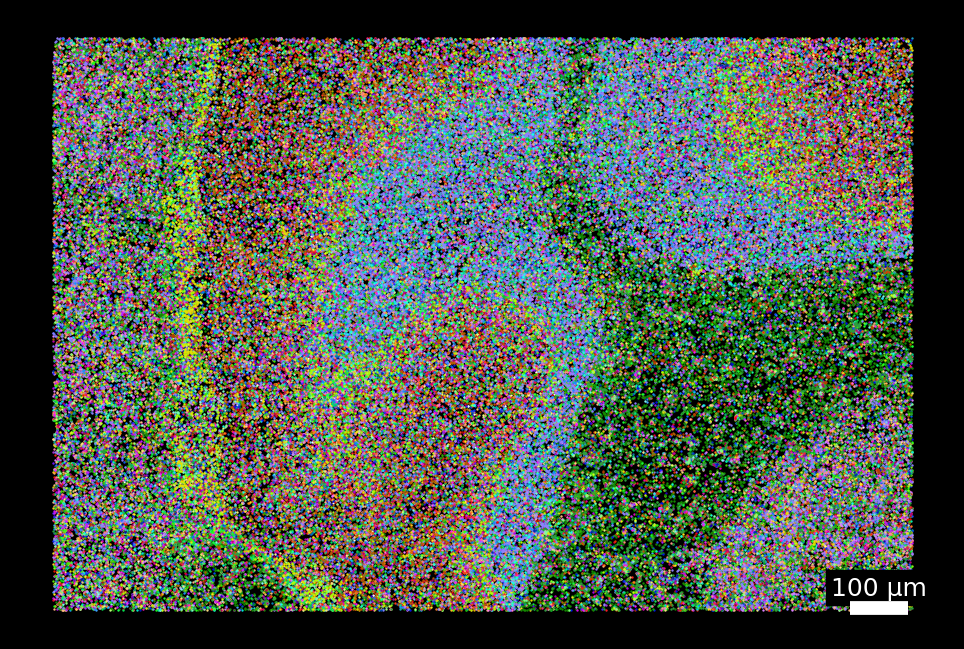

In [24]:
custom_colors = [d.color_dict[gene] for gene in d.unique_genes]
#Set Car8 to white
custom_colors[np.where(d.unique_genes == 'Car8')[0][0]] = (1, 1, 1)


d.scatter_plot(d.unique_genes, view = view, ax_scale_factor=160, s=0.5, colors = custom_colors, show_axes=False, show_legend=False)

A bit messy. It might be usefull to order the genes so that the most spatially defined genes are plot on top

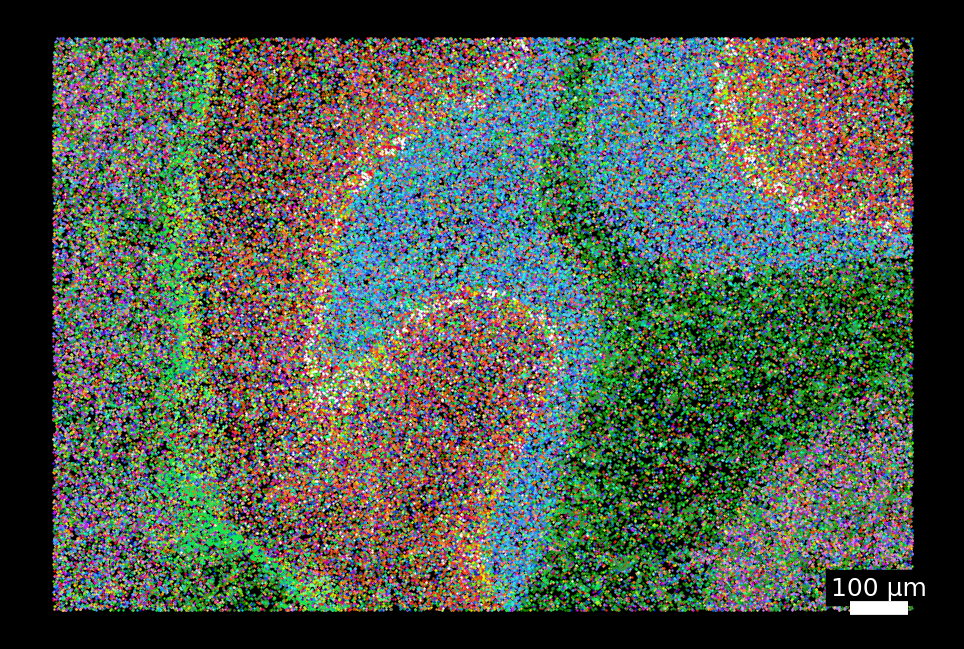

In [25]:
#Sort genes by the Gini coefficient
gene_order = d.sort_genes_by_gini(spacing=200, min_count=10)

#Prepare custom colors in same order as the new gene_order
custom_colors = [d.color_dict[gene] for gene in gene_order]
#Set Car8 to white
custom_colors[np.where(gene_order == 'Car8')[0][0]] = (1, 1, 1)

d.scatter_plot(gene_order, view = view, ax_scale_factor=160, s=0.5, colors = custom_colors, show_axes=False, show_legend=False)

# Hexagonal binning
Bin the data with hexagonal bins.

In [26]:
df_hex, coordinates = d.hexbin_make(spacing=75, min_count=10)
df_hex.head(5)

,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1188,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1189,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1190,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1191,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1192,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1193,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1194,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1195,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1196,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_1197,...,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_25875,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_25876,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26088,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26089,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26090,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26091,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26092,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26093,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26094,20220821_LBEXP20210718_EEL_Mouse_448_2_RNA_26095
2010300C02Rik,0.0,3.0,1.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A830009L08Rik,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Abi3bp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Ache,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
Acta2,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


Show the hexagonal bins with the `hexbin_plot()` function

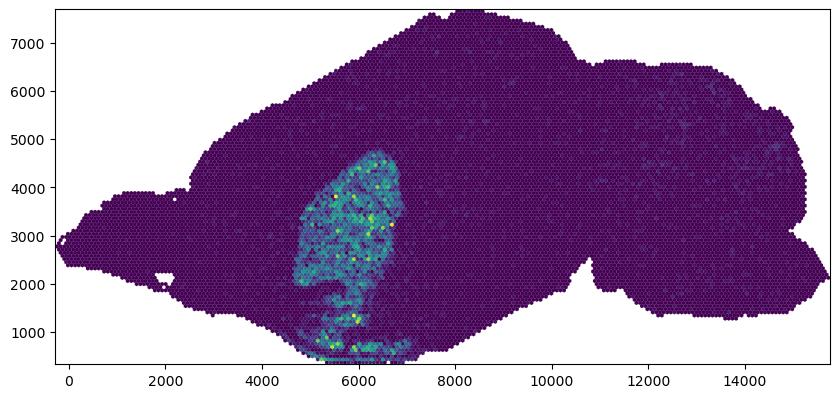

In [27]:
d.hexbin_plot(c=df_hex.loc['Adora2a'], figsize=(10,5))

Regionalize the data by clustering the hexagonal binned data. 

In [28]:
df_hex, labels, hex_coord, df_mean, df_norm = d.regionalize(spacing=75, 
                                                            min_count=10, 
                                                            n_components=[0,90],                                                        
                                                            clust_dist_threshold=100,
                                                            n_clusters = None,
                                                            clust_neighbor_rings=1)

Show the regionalization results.

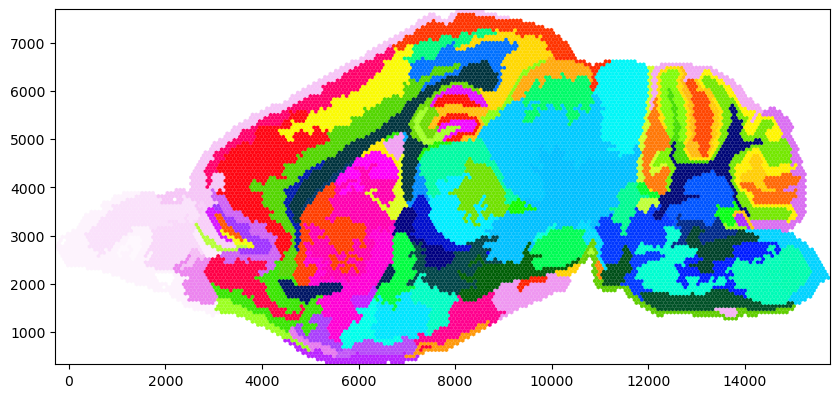

In [29]:
d.hexbin_plot(labels, cm=plt.cm.gist_ncar_r, figsize=(10,5))

Results are slightly different than the paper because we recently made a small improvement in how the FOVs of the microscope are stitched together. 

# Mix regions
Mix the colors of the regionalization results based on the probability of cluster identity.

Perfect matches: 14053 out of 14819 which is 95% accuracy


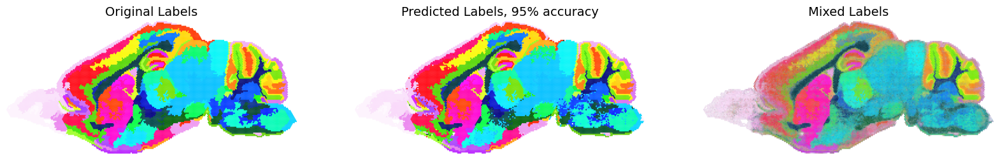

In [30]:
mix_color, predicted_prob, predicted_labels, color_dict = d.regionalization_gradient_make(df_hex, labels, max_depth=14, cm=plt.cm.gist_ncar_r)

(-281.3254128261732, 15768.674587173828, 338.5456668335951, 7688.1590586228795)

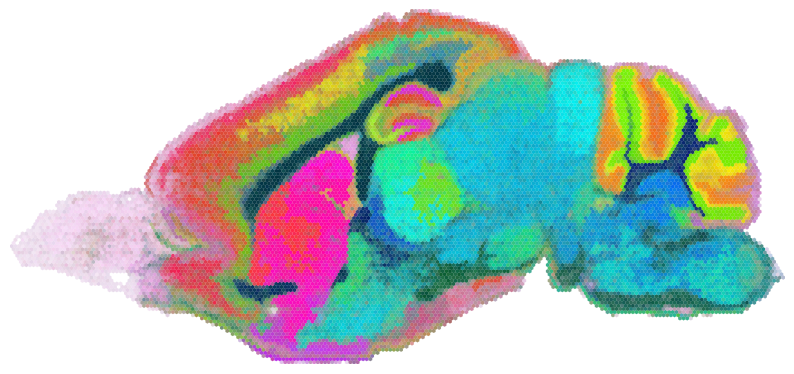

In [31]:
fig, ax = plt.subplots(figsize=(10, 5))

d.hexbin_plot(mix_color, ax = ax)
plt.axis('off')

# Borders
Calculating borders can take some time, For this example the parameters are less dense than used for the paper.  
Parameters used in the paper: `d.boundaries_make(bin_size=50, n_angles=12, radius=250, normalize=True, normalization_mode='log')`

In [43]:
borders, image, grid, grid_filt, filt_grid, shape = d.boundaries_make(bin_size=100, n_angles=6, radius=250, normalize=True, normalization_mode='log')

[########################################] | 100% Completed | 209.59 s


/home/lars/storage/Documents/FISHscale/FISHscale/spatial/boundaries.py:252: RuntimeWarning: invalid value encountered in true_divide
  stack = cm_norm * np.nan_to_num((stack / cm_repeat))
/home/lars/storage/Documents/FISHscale/FISHscale/spatial/boundaries.py:253: RuntimeWarning: invalid value encountered in true_divide
  stack_other = cm_norm * np.nan_to_num((stack_other / cm_repeat))


[########################################] | 100% Completed | 7.71 ss


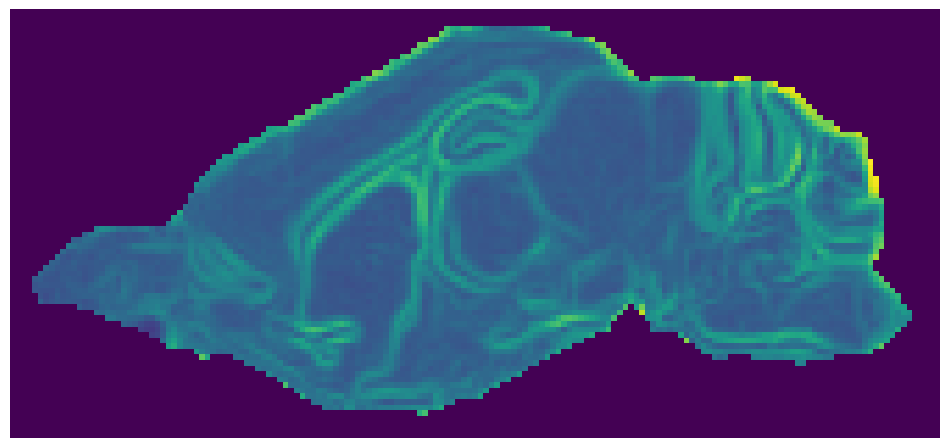

In [49]:
fig, ax = plt.subplots(figsize=(12,10))

plt.imshow(image)
ax.set_aspect('equal')
ax.axis('off')
ax.invert_yaxis();

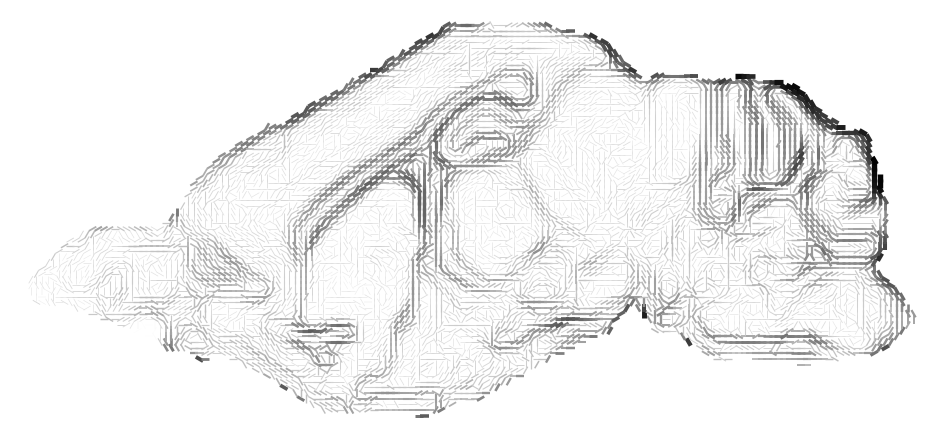

In [48]:
#Make lines at every grid point
lines = [d.bisect(75, a, g) for a,g in zip(borders[:,1], grid_filt)]
xy= np.array(lines)

fig, ax = plt.subplots(figsize=(12,10))
ax.set_xlim(d.x_min, d.x_max)
ax.set_ylim(d.y_min, d.y_max)

#Get the magnitude of the border at every position
values = borders[:,0]
values = values - values.min()
values = values / values.max()
values_inv = 1-values

#Color lines by magnitude
colors = plt.cm.gray(values_inv)

line_segments = LineCollection(xy, linestyle='solid', colors=colors, linewidths=values*4) 
ax.add_collection(line_segments)
ax.set_aspect('equal')
ax.axison=False

# Density
Calculate the density of set of points along a line. You can either calculate the raw counts or the KDE

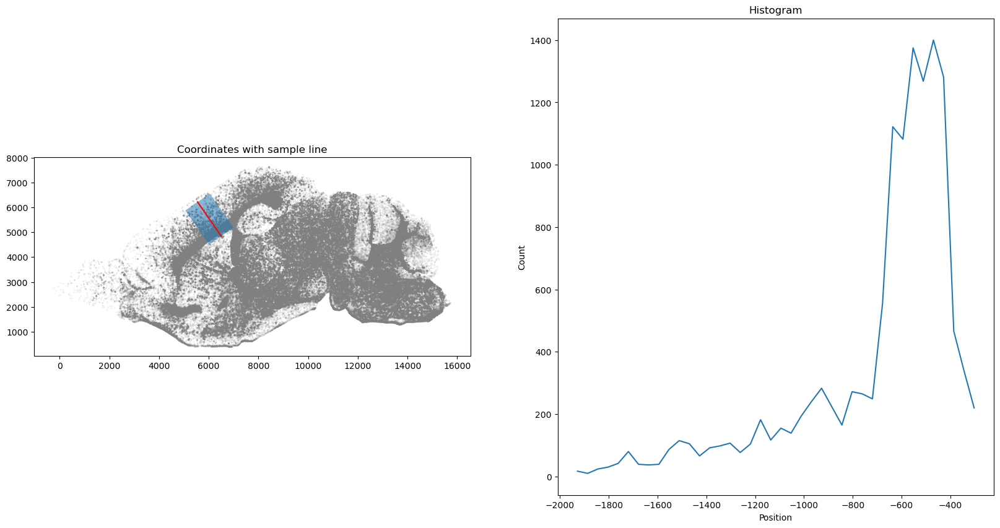

In [32]:
#Raw counts
plp1 = d.get_gene('Plp1').to_numpy()
histogram, bin_edges = d.density_count(plp1, [5550, 6220, 6500, 4850], width=1200, nbins=40, plot=True, s=0.01)

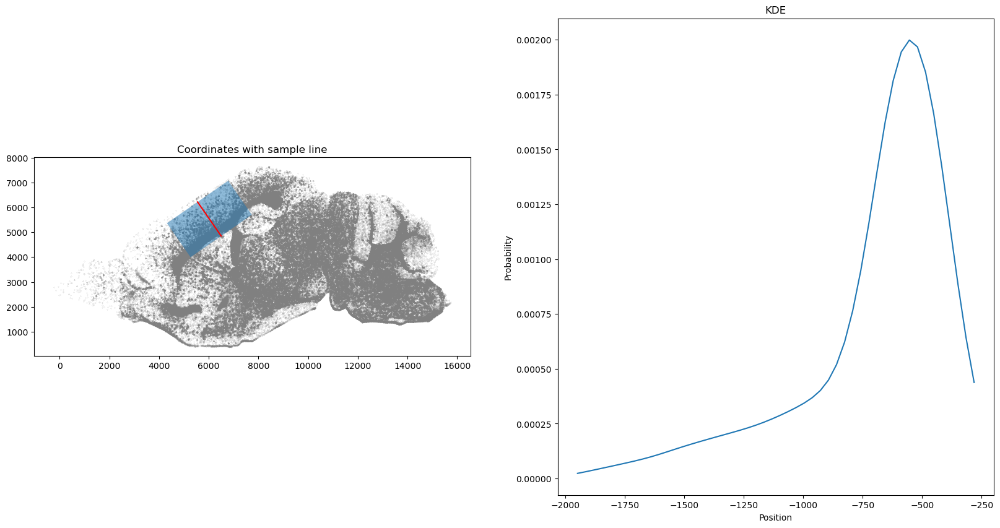

In [33]:
probability, sample_space, filt, y_coords = d.density_probability(plp1, [5550, 6220, 6500, 4850], width=3000, kernel='gaussian',
                                                                  bandwidth=100, plot=True, s=0.01)

# Gene correlation
FISHscale has multiple options to calculate correlations between expression patterns. The fastest way is to correlate the gene counts of the hexagonal binning.

In [34]:
gene_correlation = d.gene_corr_hex(df_hex, method='spearman')

In [35]:
gene_correlation.head(5)

,2010300C02Rik,A830009L08Rik,Abi3bp,Ache,Acta2,Adamts5,Adarb2,Adcyap1,Adora2a,Agrp,...,Urah,Vim,Vip,Vipr1,Vipr2,Vtn,Wfs1,Yjefn3,Zic1,Zmat4
2010300C02Rik,1.000000,0.130284,0.131520,0.008748,-0.002784,0.055708,0.052743,0.103364,0.371355,0.101188,...,0.074986,-0.017436,0.069007,0.187933,0.278165,0.109241,0.259014,0.102624,-0.114039,0.058960
A830009L08Rik,0.130284,1.000000,0.084417,0.322021,0.157082,0.184199,0.266582,0.124337,0.078913,0.069512,...,0.061784,0.037774,0.090445,0.163557,0.186621,0.146258,0.140253,0.123663,0.196225,0.191304
Abi3bp,0.131520,0.084417,1.000000,0.053213,0.067796,0.050544,0.070314,0.068094,0.064781,0.030211,...,0.026681,0.056306,0.035915,0.077431,0.083983,0.073339,0.059805,0.019689,0.053464,0.034812
Ache,0.008748,0.322021,0.053213,1.000000,0.165973,0.178193,0.217771,0.138889,0.061308,0.051120,...,0.052234,0.090436,0.056696,0.101925,0.098602,0.180743,0.165772,0.119982,0.244482,0.164391
Acta2,-0.002784,0.157082,0.067796,0.165973,1.000000,0.161673,0.147968,0.119559,0.042910,0.033455,...,0.045003,0.163372,0.095986,0.091652,0.052384,0.101368,0.076383,0.044139,0.249153,0.027906


Another way is to calculate the Coordinate Based Colocalization from: https://doi.org/10.1007/s00418-011-0880-5  
However this method is very very slow for many molecules and many genes

In [78]:
cbc = d.gene_corr_CBC(radius=100)

# Bonefight

Here we will use a single cell dataset of the mouse brain.  
Download the dataset from here: [L5_All.agg.loom](https://storage.googleapis.com/linnarsson-lab-loom/l5_all.agg.loom)  
More information on [mousebrain.org/downloads.html](http://mousebrain.org/downloads.html)  
  
Install bonefight if it is not installed yet: https://github.com/linnarsson-lab/BoneFight  
Install Loompy if it is not installed yet: http://linnarssonlab.org/loompy/installation/index.html

In [36]:
# Import loompy and open the file
import loompy
# If not installed follow these instructions: http://linnarssonlab.org/loompy/installation/index.html

# Make a connection with the single cell data. Change path to where you downloaded the L5_All.agg.loom file.
wholebrain_path = '/home/lars/Share/Dropbox (Linnarsson Group)/Linnarsson Group/Projects/EEL/Data/Single_cell/L5_All.agg.loom'
ds = loompy.connect(wholebrain_path)

In [37]:
#Make the views for Bonefight
    #wholebrain
    #select matching genes. 2 genes could not be found Pclaf & Stum
gene_filt = np.isin(ds.ra.Gene, df_hex.index.to_numpy())
#Select only brain regions
exclude_region = ['Enteric nervous system', 'Sympathetic ganglion', 'Dorsal root ganglion', 'Spinal cord', 'Dorsal root ganglion,Sympathetic ganglion' ]
region_filt = np.isin(ds.ca.Region, exclude_region, invert=True)

#Select data based on regions and genes
wb_data=ds[:,:][gene_filt, :]
wb_data = wb_data[:,region_filt]
wb_genes = ds.ra.Gene[gene_filt]

#Cluster names
clust_name_dict = dict(zip(ds.ca.ClusterName[region_filt], range(len(ds.ca.ClusterName[region_filt]))))
clust_description_dict = dict(zip(ds.ca.ClusterName[region_filt], (ds.ca.Description[region_filt])))

#make dataframe
wb_df = pd.DataFrame(wb_data, index = wb_genes, columns=ds.ca.ClusterName[region_filt])

#Size input for the single cell data is the number of cells per cluster.
wb_size = ds.ca.NCells[region_filt]

#Size input for the spatial data is an array of ones because the hexagons are all equal in size.
hb_size_equal = np.ones(df_hex.shape[1])

    435 matching features between X_1 and X_2


100%|████████████| 100/100 [00:15<00:00,  6.38it/s, loss=-1.2572812]


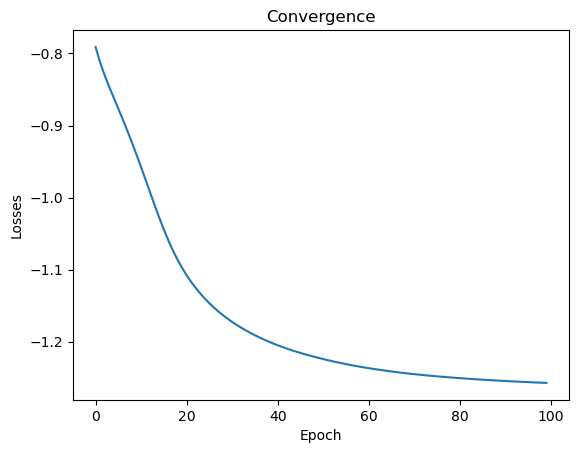

In [38]:
#Train the bonefight model
model, y = d.bonefight(wb_df, wb_size, X_2=df_hex, volume_2=hb_size_equal, plot=True, transform=True)

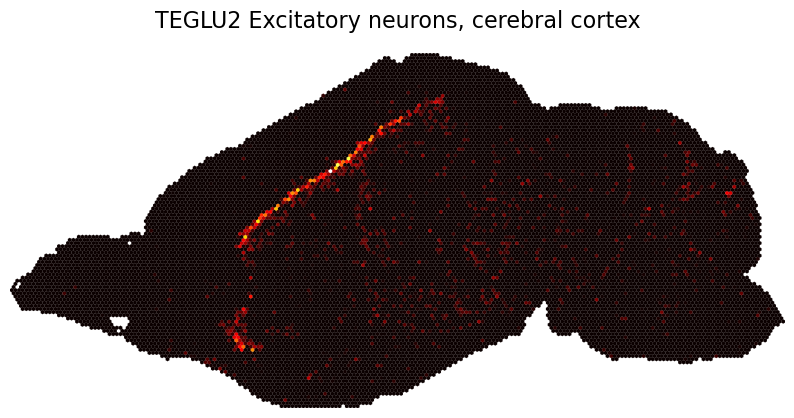

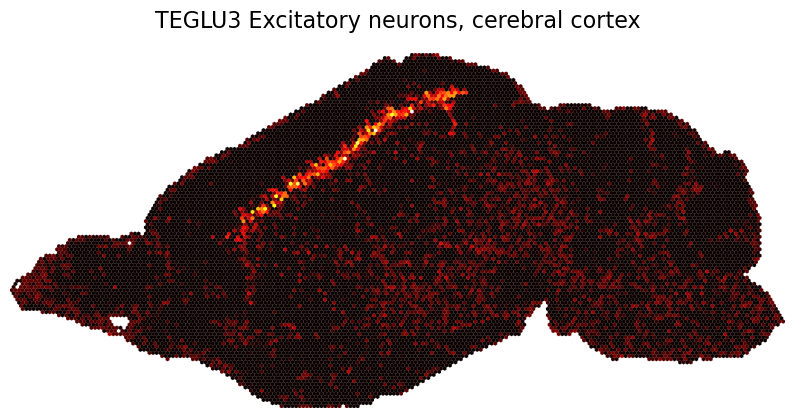

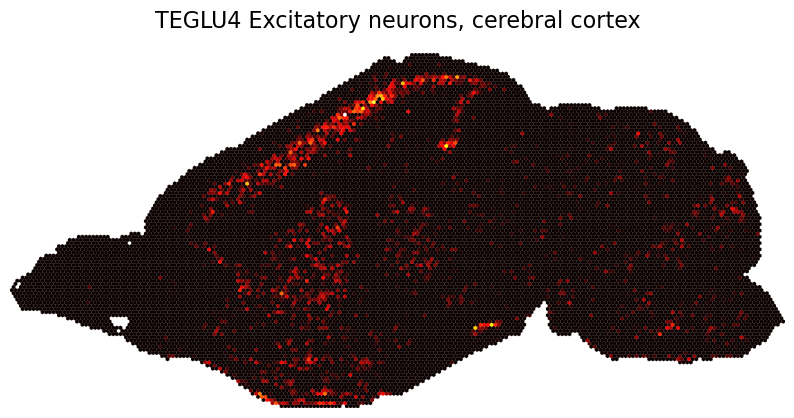

In [39]:
#Plot a few example cluster spatial probabilities
cortex_layers = ['TEGLU2', 'TEGLU3', 'TEGLU4']


for clust in cortex_layers:

    idx = np.where(wb_df.columns==clust)[0][0]
    
    #Get max value to make the same for each plot
    max_y = y[:,idx].max()
    
    d.hexbin_plot(y[:,idx], vmin=0, vmax=max_y, cm=plt.cm.hot)
    
    plt.axis('off')
    clust_desctription = clust_description_dict[clust]
    plt.title(f'{clust} {clust_desctription}', fontsize=16, y=1.05)

### Gene imputation
The Bonefight model has a transform function so that you can impute the gene expression of non-measured genes.  

In [40]:
# Get the full single cell dataset
wb_data_full= ds[:,:][:, region_filt]

In [41]:
# Impute spatial gene expression
y_full = model.transform(wb_data_full.T)

Pitx3 was measured by original EEL dataset: False


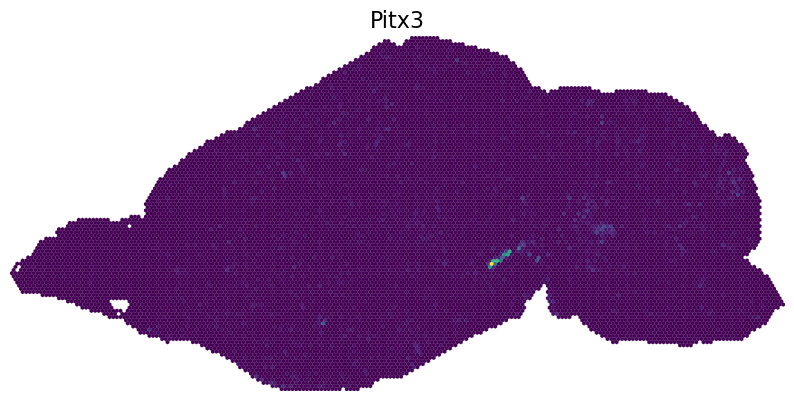

In [42]:
#plot the imputed spatial gene expression of a gene.
gene = 'Pitx3' #Pitx3 is a gene specifically expressed in the Supbstantia nigra and Ventral Tegmental Area

#Test if gene was measured (True) or imputed (False)
print(f'{gene} was measured by original EEL dataset: {np.isin(gene, d.unique_genes)}')

# Get index of gene
gene_index = np.where(ds.ra.Gene == gene)[0][0]

# Plot imputed gene expression
d.hexbin_plot(y_full[:, gene_index])

plt.title(gene, fontsize=16)
plt.axis('off');